In [1]:
import pandas as pd
import plotly.express as px

In [2]:
train = pd.read_csv('/home/workspace/data/GLDv2/train/train_clean_custom.csv')

In [3]:
# displaying only top 30 landmark
landmark = train.landmark_id.value_counts()
landmark_df = pd.DataFrame({'landmark_id':landmark.index, 'frequency':landmark.values}).head(30)

landmark_df['landmark_id'] = landmark_df.landmark_id.apply(lambda x: f'landmark_id_{x}')

fig = px.bar(landmark_df, x="frequency", y="landmark_id",color='landmark_id', orientation='h',
             hover_data=["landmark_id", "frequency"],
             height=1000,
             title='Number of images per landmark_id (Top 30 landmark_ids)')
fig.show()

- landmark 종류는 63,428개, 이미지 전체 개수는 1,342,470개
- 6,000개 이미지를 가진 랜드마크가 존재함(landmark id: 138982)
- 그 다음엔 2,000개 이미지를 가진 랜드마크가 존재함(landmark id: 62798)
- 61,583개의 랜드마크가 100개 이하 이미지를 가지고 있음(97.1%)

In [7]:
landmark_df = landmark.to_frame(name='frequency')

In [8]:
landmark_df[landmark_df['frequency'] <= 100]

,frequency
landmark_id,
59833,100
63593,100
28989,100
3046,100
89587,100
...,...
101612,2
145164,2
22873,2


In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1342470 entries, 0 to 1342469
Data columns (total 4 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   id           1342470 non-null  object
 1   landmark_id  1342470 non-null  int64 
 2   description  1342470 non-null  object
 3   language     1342470 non-null  object
dtypes: int64(1), object(3)
memory usage: 41.0+ MB


In [10]:
import PIL
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
TRAIN_DIR = '/home/workspace/data/GLDv2/train/image'

def display_images(images, title=None): 
    f, ax = plt.subplots(5,5, figsize=(18,22))
    if title:
        f.suptitle(title, fontsize = 30)

    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id[0]}/{image_id[1]}/{image_id[2]}/{image_id}.jpg')
        image = Image.open(image_path)
        
        ax[i//5, i%5].imshow(image) 
        image.close()       
        ax[i//5, i%5].axis('off')

        landmark_id = train[train.id==image_id.split('.')[0]].landmark_id.values[0]
        ax[i//5, i%5].set_title(f"ID: {image_id.split('.')[0]}\nLandmark_id: {landmark_id}", fontsize="12")

    plt.show() 

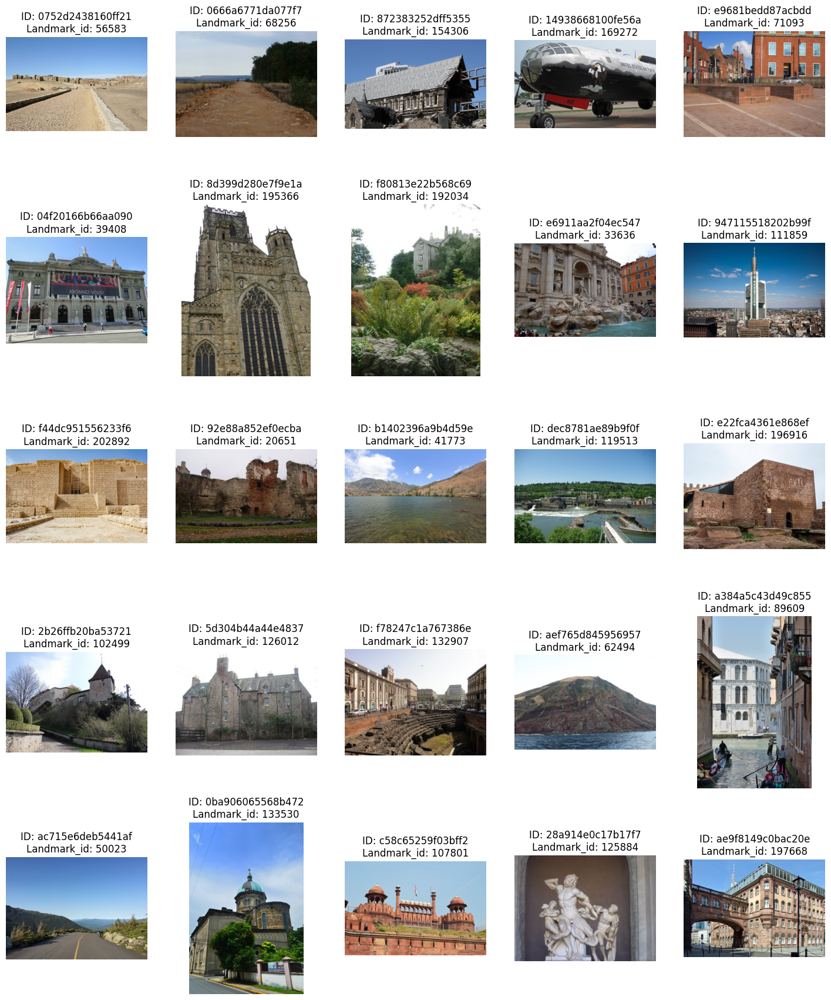

In [11]:
samples = train.sample(25).id.values
display_images(samples)

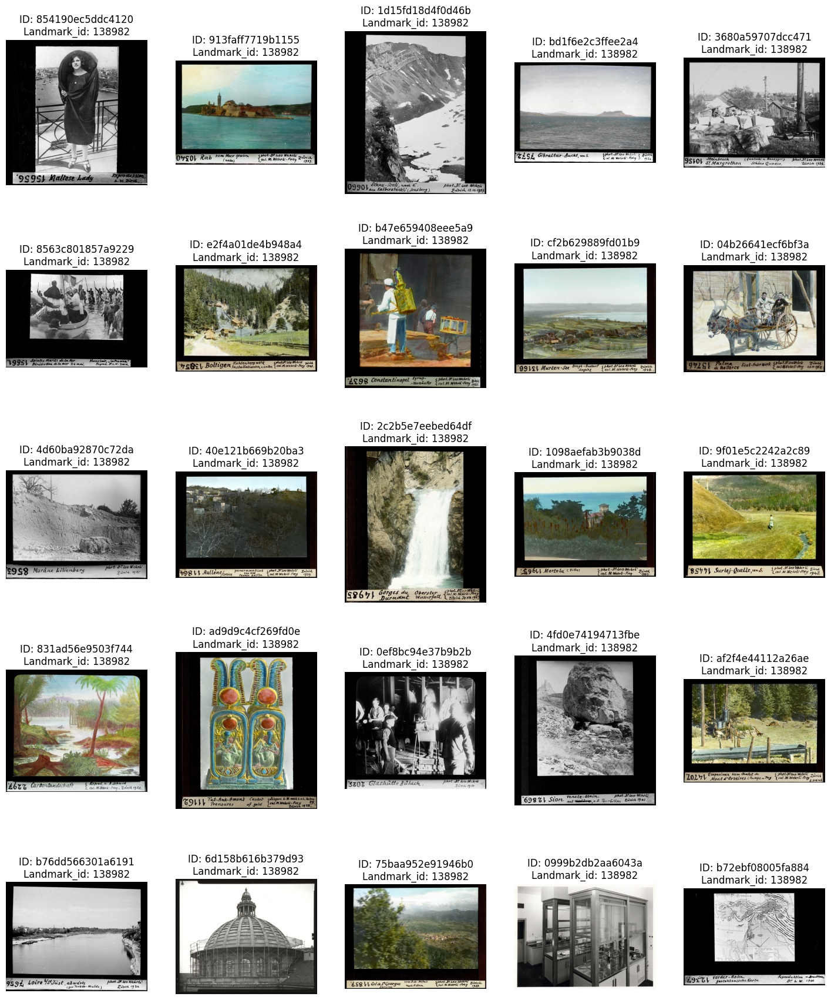

In [12]:
samples = train[train.landmark_id == 138982].sample(25).id.values

display_images(samples)

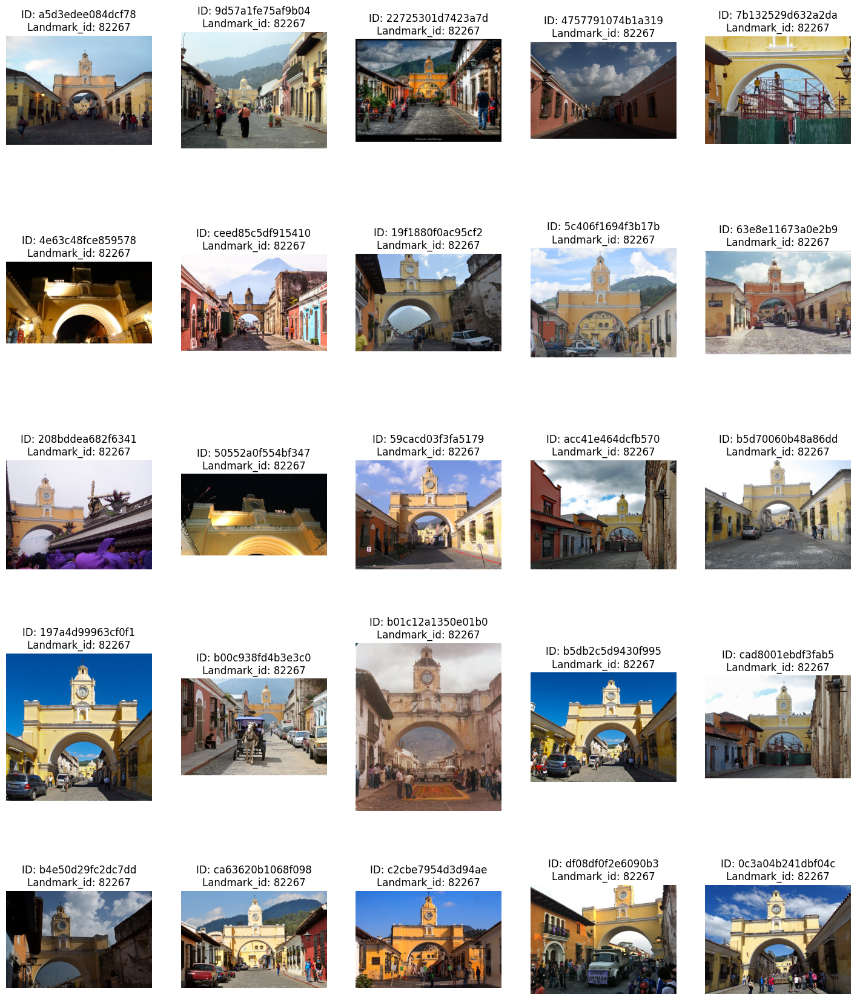

In [13]:
samples = train[train.landmark_id == 82267].sample(25).id.values

display_images(samples)

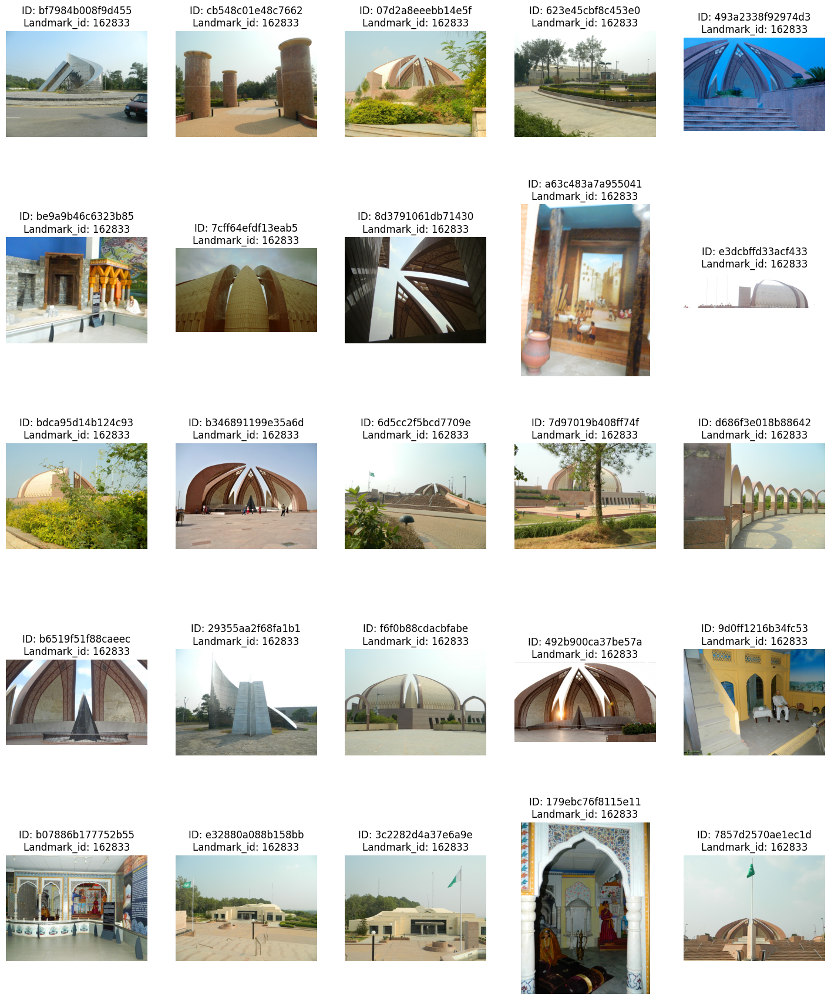

In [14]:
samples = train[train.landmark_id == 162833].sample(25).id.values

display_images(samples)

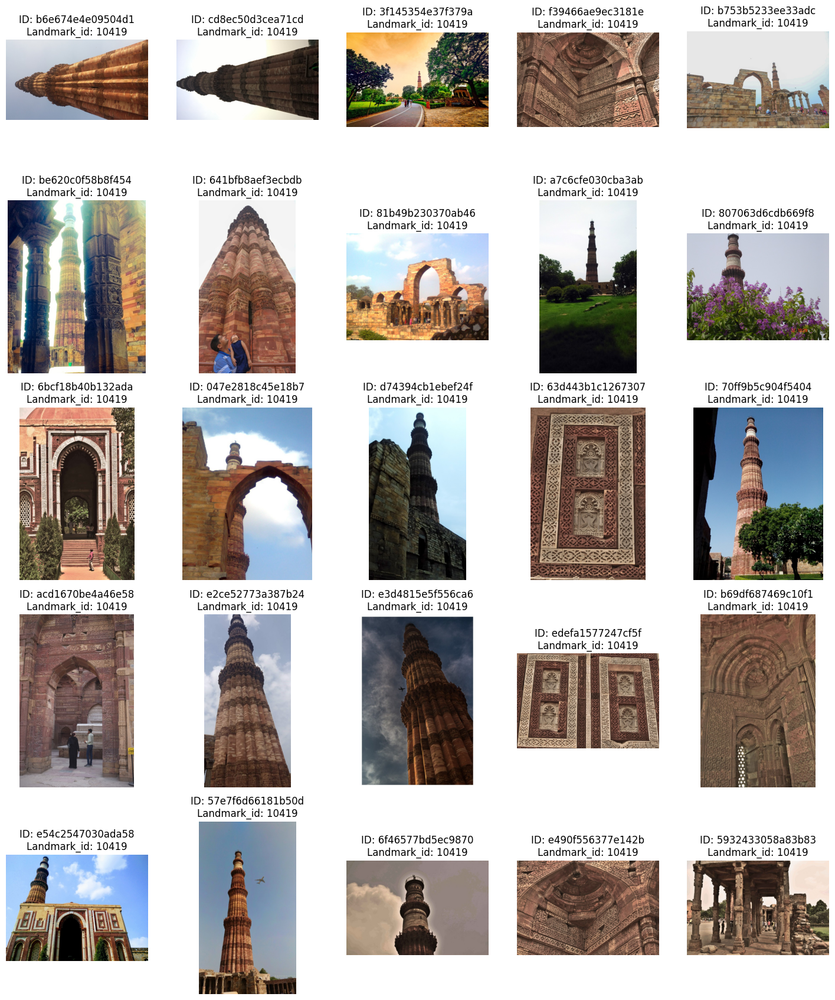

In [15]:
samples = train[train.landmark_id == 10419].sample(25).id.values

display_images(samples)

### 랜드마크별 균등 샘플링

In [18]:
# 각 랜드마크당 최대 K개의 이미지를 샘플링
# 만약 K개보다 적으면, 있는 만큼 모두 샘플링
K = 5

# groupby와 apply를 사용하여 각 그룹(랜드마크)별로 샘플링 수행
sample_df = train.groupby('landmark_id').apply(
    lambda x: x.sample(n=min(len(x), K)),
    include_groups=False # pandas > 2.x
).reset_index(drop=True)

In [19]:
sample_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 293871 entries, 0 to 293870
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   id           293871 non-null  object
 1   description  293871 non-null  object
 2   language     293871 non-null  object
dtypes: object(3)
memory usage: 6.7+ MB


In [20]:
sample_df.to_csv('/home/workspace/data/GLDv2/train/train_clean_custom_sampling.csv')